In [1]:
import sys
sys.path.insert(0,'/nfs/nfs2/users/riadoshi/bigvision_palivla/')
sys.path.insert(0, '/nfs/nfs2/users/riadoshi/bigvision_palivla/src/')
sys.path.insert(0,'/nfs/nfs2/users/riadoshi/bigvision_palivla/dlimp')
sys.path.insert(0,'/nfs/nfs2/users/riadoshi/bigvision_palivla/models')

import os
os.environ['PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION'] = 'python'

import tensorflow as tf
tf.config.set_visible_devices([], "GPU")

import jax
import jax.experimental.multihost_utils as mhu
from jax.experimental import multihost_utils

from absl import flags
import optax
import numpy as np
import orbax.checkpoint as ocp
from transformers import AutoTokenizer
import mediapy
from ml_collections import config_flags
from typing import Any

from scalax.sharding import MeshShardingHelper, FSDPShardingRule

from palivla.components.train_state import ShardingMetadata
from palivla.model_components import ModelComponents
from octo.data.utils.data_utils import NormalizationType

from palivla.dataset import make_trajectory_dataset

from scripts.train import create_model

from big_vision.utils import Registry

from octo.data.oxe import make_oxe_dataset_kwargs
from octo.data.dataset import make_single_dataset

2025-03-14 06:05:32.751071: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-14 06:05:32.755222: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-14 06:05:32.767717: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741932332.789895  955996 cuda_dnn.cc:8501] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741932332.795560  955996 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-14 06:05:32.813916: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

ModuleNotFoundError: No module named 'mediapy'

In [2]:
# Reset flags if the cell is re-run
try:
    flags.FLAGS.unparse_flags()
except AttributeError:
    flags.FLAGS._flag_values_dict.clear()

# Define the config flag only if it hasn't been defined
if "config" not in flags.FLAGS:
    config_flags.DEFINE_config_file(
        "config", "/nfs/nfs2/users/riadoshi/bigvision_palivla/configs/cot_bridge_config.py", "Path to the config file."
    )

import sys
flags.FLAGS(sys.argv, known_only=True)

config = flags.FLAGS.config

In [3]:

# # MODEL_PATH, MODEL_STEP = 'gs://kyle-checkpoints-c2/paligemma-checkpoints/solar-feather-24', 40000
# MODEL_PATH, MODEL_STEP = 'gs://kyle-checkpoints-c2/paligemma-checkpoints/stellar-meadow-22', 50000


# mesh = MeshShardingHelper([-1], ["fsdp"])
# sharding_metadata = ShardingMetadata(
#     mesh=mesh,
#     model_sharding_rule=FSDPShardingRule(
#         "fsdp", fsdp_axis_size=mesh.mesh.shape["fsdp"]
#     ),
# )

# optimizer = optax.identity()
# print("Loading model params...")

# model = create_model(config, sharding_metadata)
# for load_fn, load_fn_kwargs in config.load_fns:
#     load_fn = Registry.lookup(load_fn)
#     load_fn(model, **load_fn_kwargs)

# restore_manager = ocp.CheckpointManager(
#     MODEL_PATH, options=ocp.CheckpointManagerOptions()
# )
# model.load_state(MODEL_STEP, restore_manager)
# train_state = model.train_state

Loading model params...


/nfs/nfs2/users/riadoshi/bigvision_palivla/.venv/lib/python3.11/site-packages/jax/_src/compiler.py:742: UserWarning: Error writing persistent compilation cache entry for 'jit_convert_element_type': PermissionError: [Errno 13] Permission denied: '/tmp/jax_cache/jit_convert_element_type-5684b4017d0a256124a017a97d7965c054f0332a70dd55b82a1f3df010fa17de-cache'
  warnings.warn(
/nfs/nfs2/users/riadoshi/bigvision_palivla/.venv/lib/python3.11/site-packages/jax/_src/compiler.py:742: UserWarning: Error writing persistent compilation cache entry for 'jit__threefry_seed': PermissionError: [Errno 13] Permission denied: '/tmp/jax_cache/jit__threefry_seed-12a6e9439b0a28d1027aa54e9bac437bed376e0d6b9760c7662e6bf0616fb271-cache'
  warnings.warn(
/nfs/nfs2/users/riadoshi/bigvision_palivla/.venv/lib/python3.11/site-packages/jax/_src/compiler.py:742: UserWarning: Error writing persistent compilation cache entry for 'jit__threefry_split': PermissionError: [Errno 13] Permission denied: '/tmp/jax_cache/jit__t

/nfs/nfs2/users/riadoshi/bigvision_palivla/.venv/lib/python3.11/site-packages/jax/_src/compiler.py:742: UserWarning: Error writing persistent compilation cache entry for 'jit_sharding_constrained_fun': PermissionError: [Errno 13] Permission denied: '/tmp/jax_cache/jit_sharding_constrained_fun-c9cb8bc7ac9c5d581f289228f5230400fdf8e16f9d16fb6187c0fbfb2b2c8358-cache'
  warnings.warn(


Replacing param /llm/embedder/input_embedding with subarray strategy


I0202 01:00:19.289645 3077977 google_auth_provider.cc:181] Running on GCE, using service account 180902422847-compute@developer.gserviceaccount.com


In [4]:
viz_kwargs = {
    "name": "aloha_pick_place_dataset",
    "data_dir": "gs://rail-orca-central2/resize_256_256",
    "load_camera_views": ["primary"],
    "load_depth": False,
    "load_proprio": True,
    "load_language": True,
    "force_recompute_dataset_statistics": False,
    "action_proprio_normalization_type": NormalizationType.NORMAL,
    "frame_transform_kwargs": {
        "image_augment_kwargs": {},
        "resize_size": {"primary": [224, 224]},
    }
}
viz_dataset =  make_trajectory_dataset(**viz_kwargs,train=True)
viz_dataset_iterator = viz_dataset.iterator()

loading cot data
loaded cot data!
building the reasoning dict...


reasoning dict: 100%|██████████| 53192/53192 [01:29<00:00, 591.07it/s]


Example reasoning: 0_0 gripper<loc0264><loc0360>;Silver tray<loc0788><loc0400><loc1020><loc0816>;gripper<loc0370><loc0346>;gripper<loc0160><loc0400>;gripper<loc0621><loc0561>;gripper<loc0278><loc0552>;
Reasoning presence statistics [# has not, # has]: [14577, 38615]
Reasoning lengths: mean 186.0639695181805, min 0, max 2028, p99 621.0, p99.9 924.0
AttributeError: module 'ml_dtypes' has no attribute 'float8_e3m4'
Cause: Unable to locate the source code of <function _gcd_import at 0x7f0461a57d80>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function _gcd_import at 0x7f0461a57d80>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


Cause: Unable to locate the source code of <function _gcd_import at 0x7f0461a57d80>. Note that functions defined in certain environments, like the interactive Python shell, do not expose their source code. If that is the case, you should define them in a .py source file. If you are certain the code is graph-compatible, wrap the call using @tf.autograph.experimental.do_not_convert. Original error: could not get source code
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


2025-02-02 01:02:23.401181: I tensorflow/core/kernels/data/tf_record_dataset_op.cc:387] The default buffer size is 262144, which is overridden by the user specified `buffer_size` of 8388608


In [5]:
viz_trajectories = [next(viz_dataset_iterator) for _ in range(25)]
# for t in viz_trajectories:
#     t['observation']['image_primary'] = t['observation']['image_high']
#     t['observation']['pad_mask_dict']['image_primary'] = t['observation']['pad_mask_dict']['image_high']
#     t['observation'].pop('image_high')
#     t['observation'].pop('proprio_bimanual')

2025-02-02 01:02:24.416170: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 4073481 bytes after encountering the first element of size 4073481 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


In [6]:
from palivla.visualizations.chain_of_thought import parse_cot_string, visualize_trajectory, TrajectoryData
import matplotlib.pyplot as plt
import io
from PIL import Image


def create_viz(
    image: np.ndarray,
    trajectory: TrajectoryData,
    prompt_str: str,
) -> np.ndarray:
    """Create a side-by-side visualization comparing predicted and target trajectories.

    Args:
        image: Input image to show in both panels
        pred_trajectory: Predicted trajectory from the model
        target_trajectory: Target/ground truth trajectory
        prompt_str: Text prompt to show as subtitle

    Returns:
        PIL Image containing the rendered figure
    """
    # Create figure with two subplots side by side
    fig, (ax1) = plt.subplots(1, 1, figsize=(6, 6))

    # Remove <pad> from prompt string
    prompt_str = prompt_str.replace("<pad>", "")
    fig.suptitle(prompt_str, wrap=True)

    # Plot predicted and target trajectories
    visualize_trajectory(ax1, image, trajectory, "Trajectory")

    # Adjust layout and convert to image
    plt.tight_layout()

    # Convert figure to PIL Image
    buf = io.BytesIO()
    plt.savefig(buf, format="png")
    buf.seek(0)
    img = Image.open(buf)
    plt.close(fig)

    return img

def chain_of_thought(trajectory):
    frame = jax.tree_map(lambda x: x[:1], trajectory)
    frame["observation"] = jax.tree_map(lambda x: x[None], frame["observation"])
    frame["action"] = trajectory["action"][None, :1, :]

    # Predict chain-of-thought
    sequences = model.build_sequence(frame, begin_is_prompt=True)

    target_gen_tokens = sequences["gen"]["tokens"]
    target_gen_text_tokens = np.array(
        [model.language_tokenizer.decode(tok) for tok in target_gen_tokens[0]]
    )

    prompt_tokens = sequences["prompt"]["tokens"]
    prompt_text_tokens = np.array(
        [
            model.language_tokenizer.decode(tok)
            for tok in prompt_tokens[0]
            if tok != "<pad>"
        ]
    )
    # print(prompt_text_tokens)

    # Get action start indices
    target_action_start_idx = (
        np.min(np.argwhere(target_gen_text_tokens == "<begin_of_action>")) + 1
    )

    # Concatenate tokens into strings
    prompt_str = "".join(prompt_text_tokens)
    target_cot_str = "".join(target_gen_text_tokens[:target_action_start_idx])

    # Parse both predicted chain of thought string
    target_trajectory = parse_cot_string(target_cot_str)

    # Create side-by-side visualization
    image = frame["observation"]['image_primary'].squeeze()
    comparison_image = create_viz(
        image, target_trajectory, prompt_str
    ) # this is just gonna be predicted trajectory twice

    return comparison_image



dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])


/tmp/ipykernel_3075994/3200068134.py:46: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  frame = jax.tree_map(lambda x: x[:1], trajectory)
/tmp/ipykernel_3075994/3200068134.py:47: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  frame["observation"] = jax.tree_map(lambda x: x[None], frame["observation"])


(224, 224, 3)


""

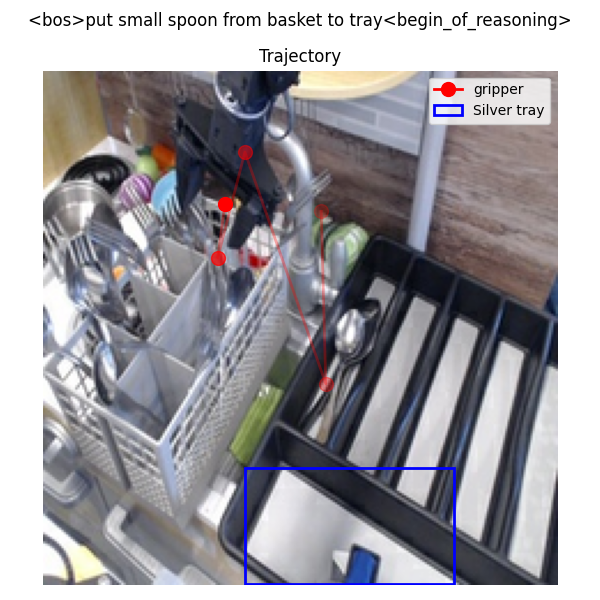

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

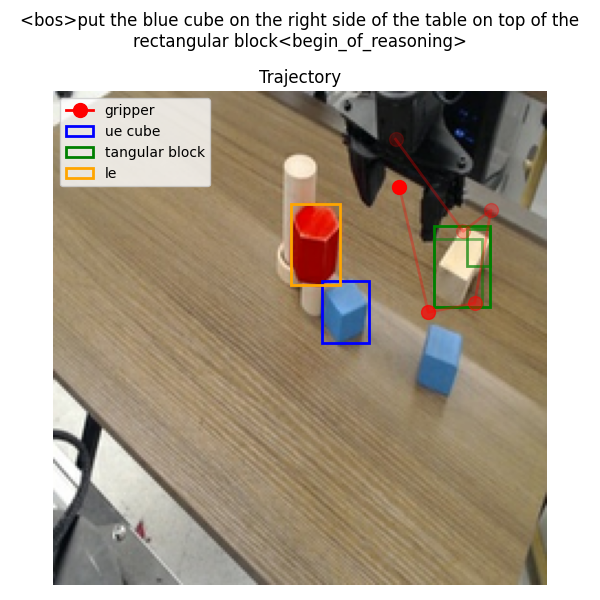

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

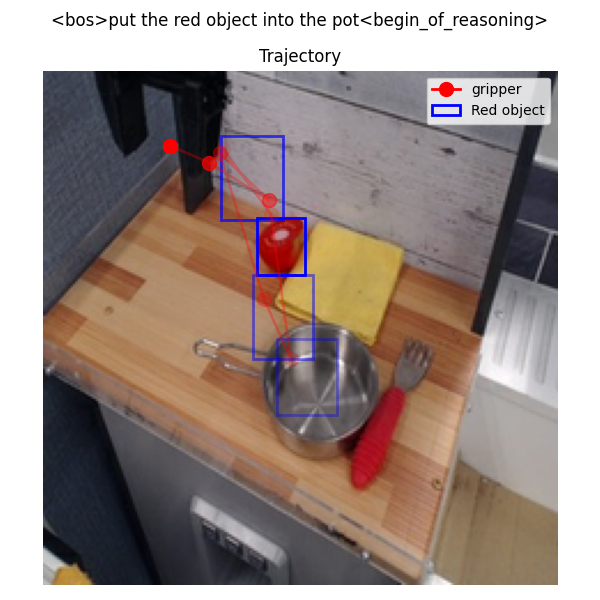

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

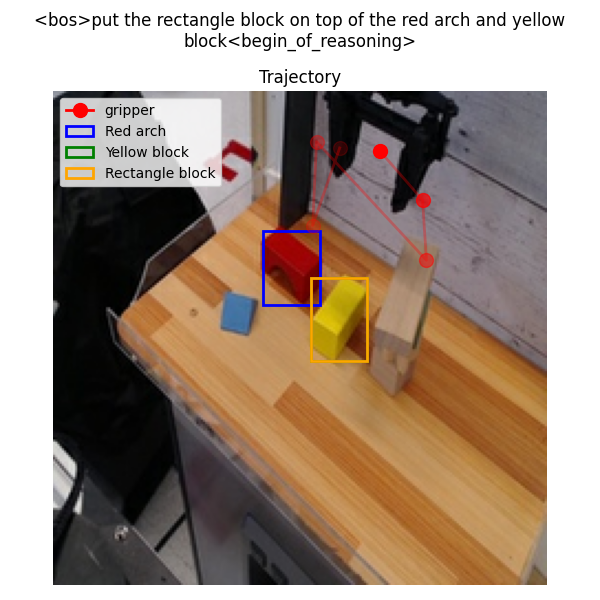

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


/nfs/nfs2/users/riadoshi/bigvision_palivla/src/palivla/visualizations/chain_of_thought.py:95: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


""

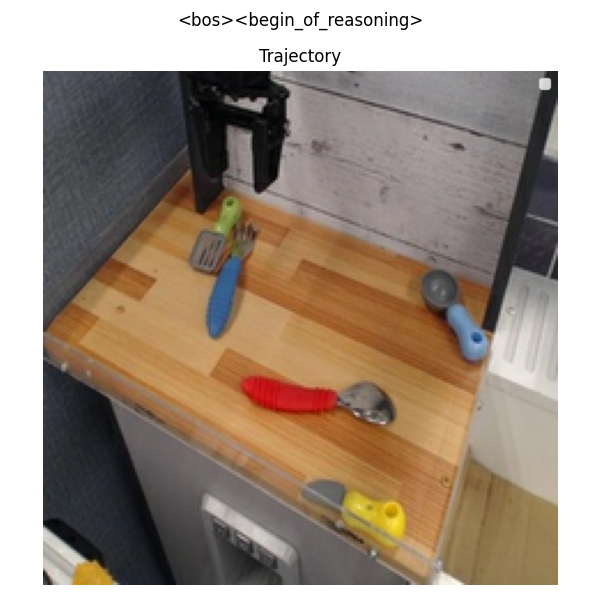

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

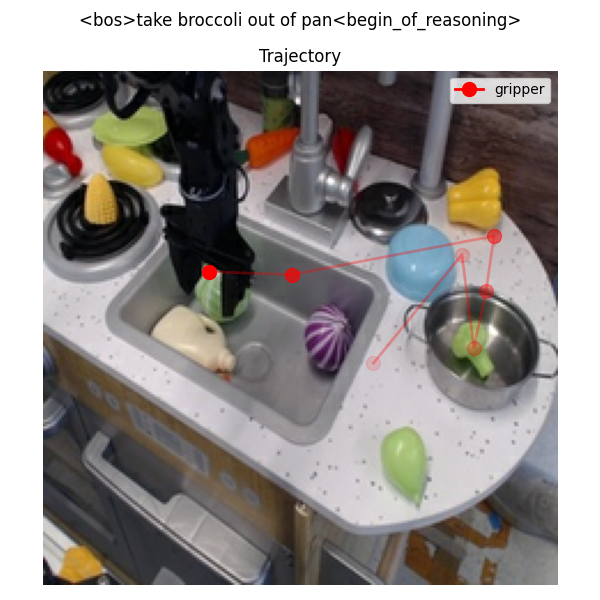

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

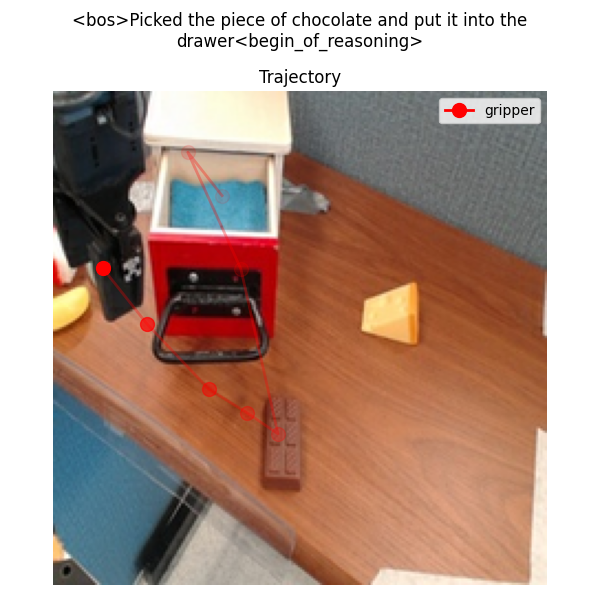

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

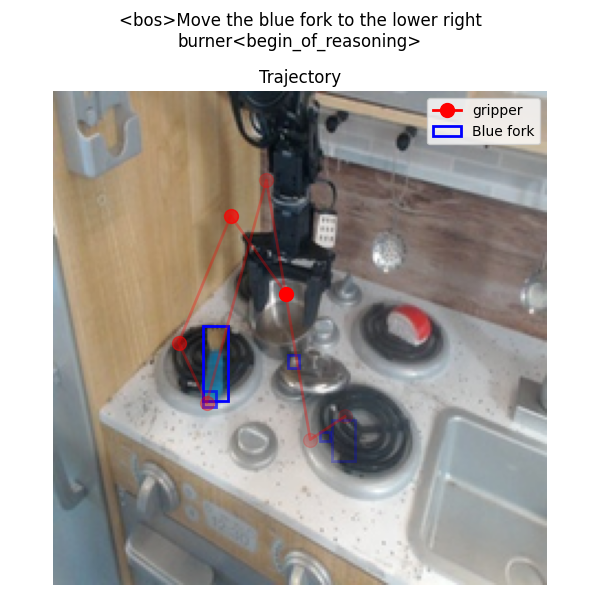

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

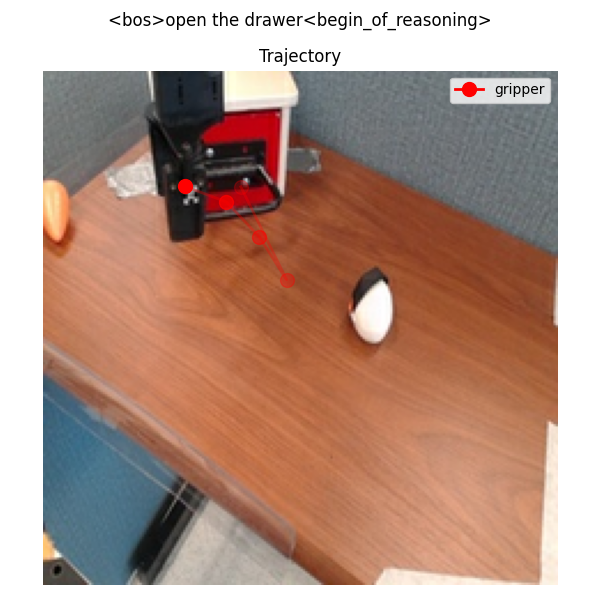

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

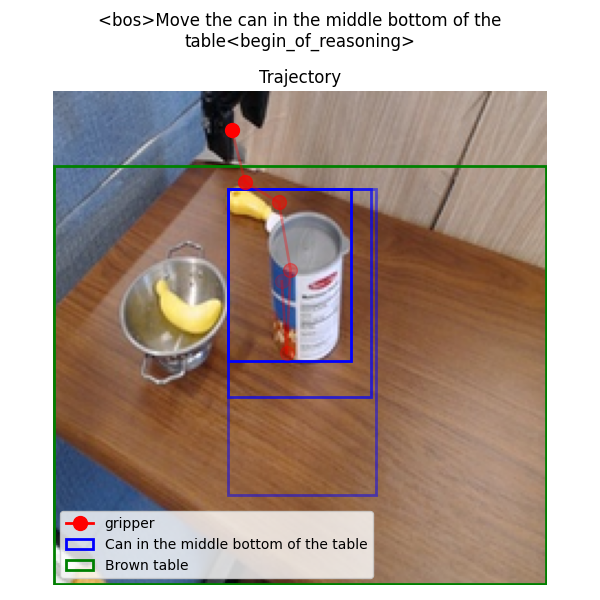

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

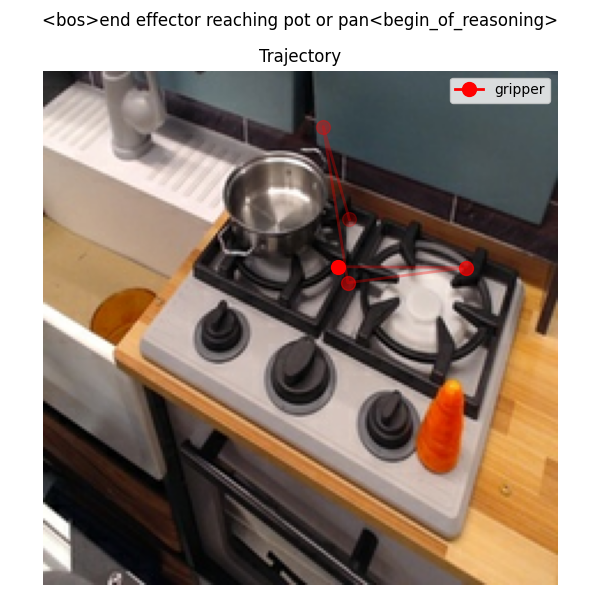

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

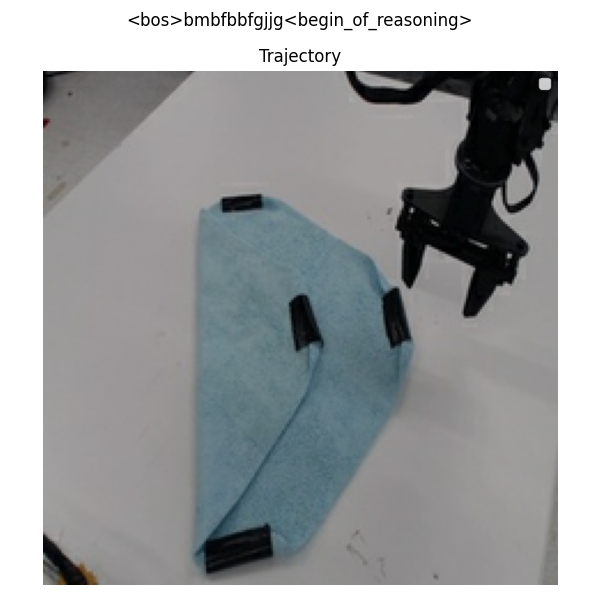

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

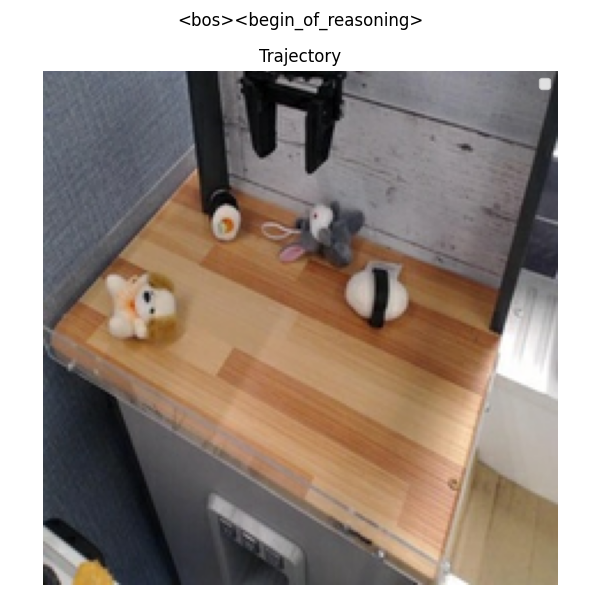

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

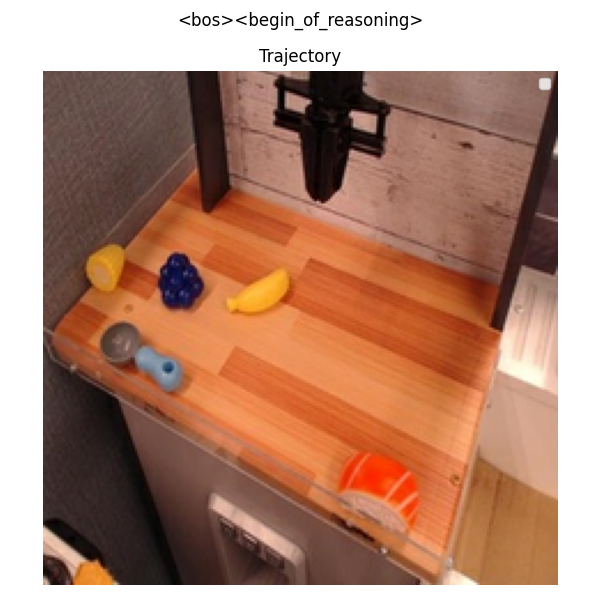

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

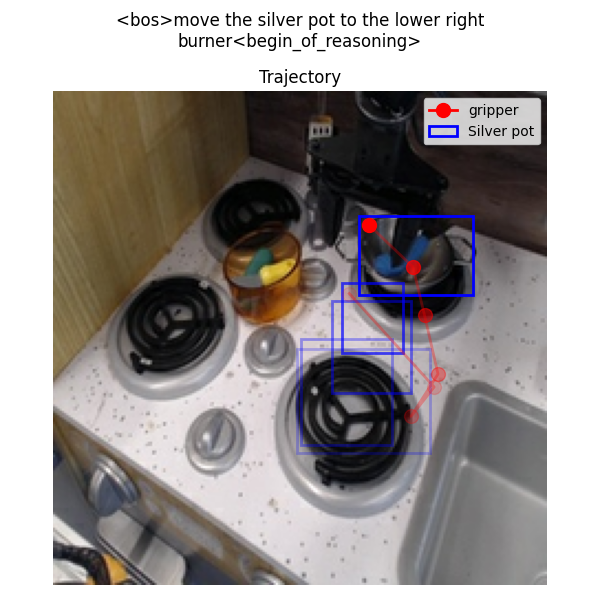

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

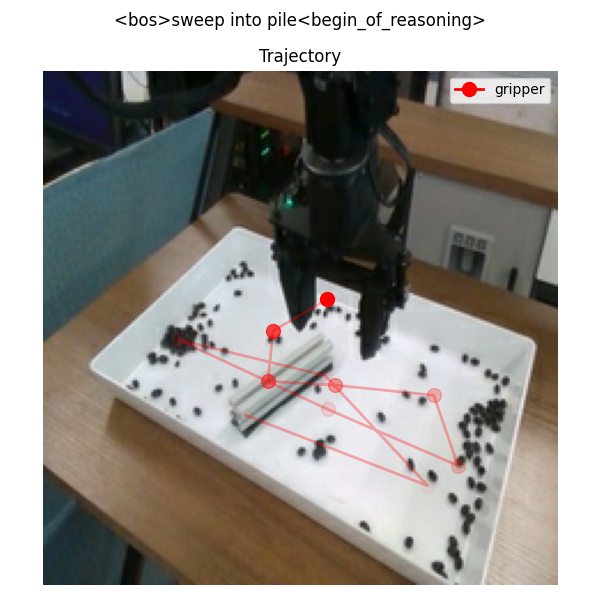

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

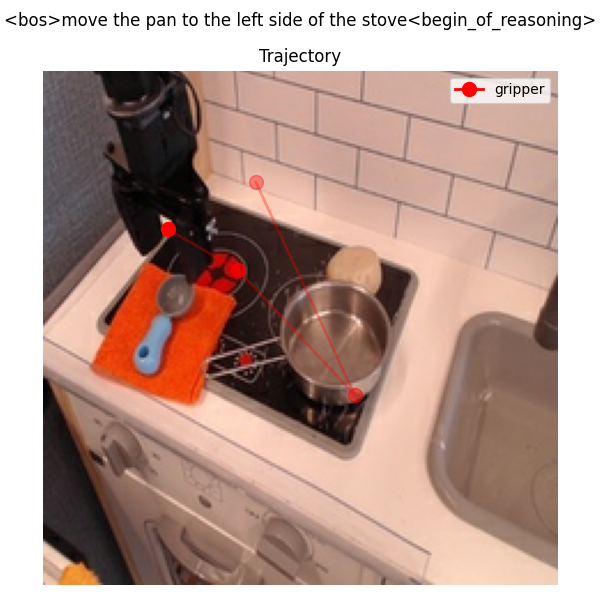

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

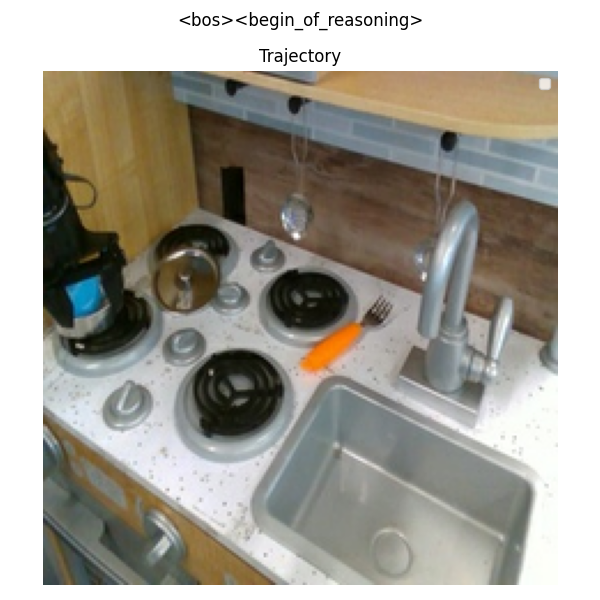

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

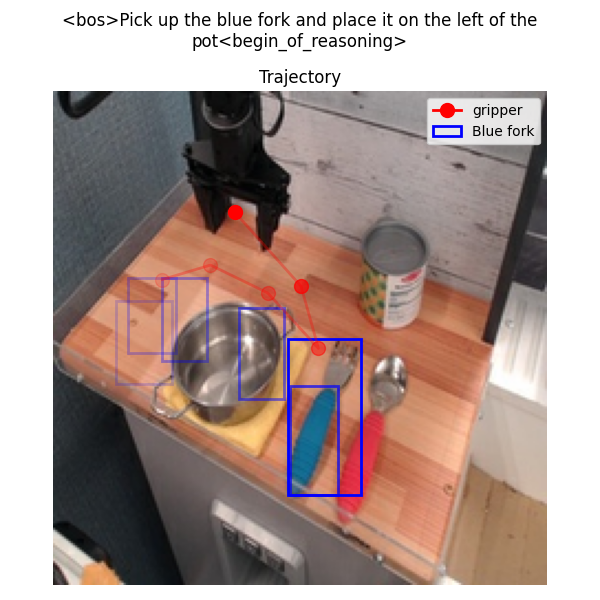

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

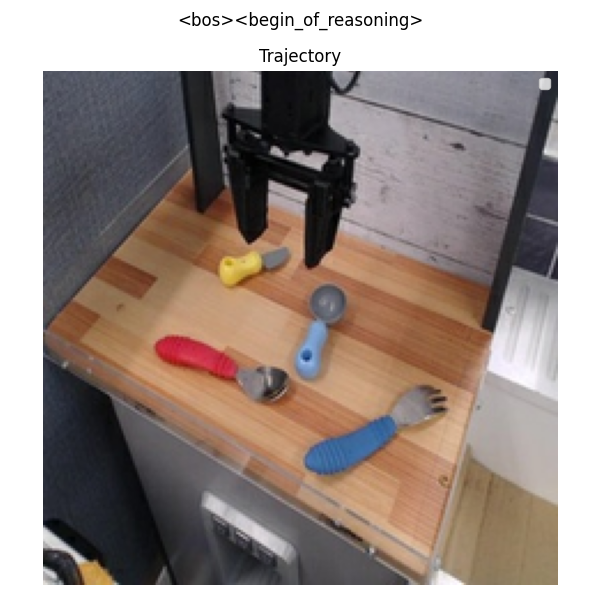

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

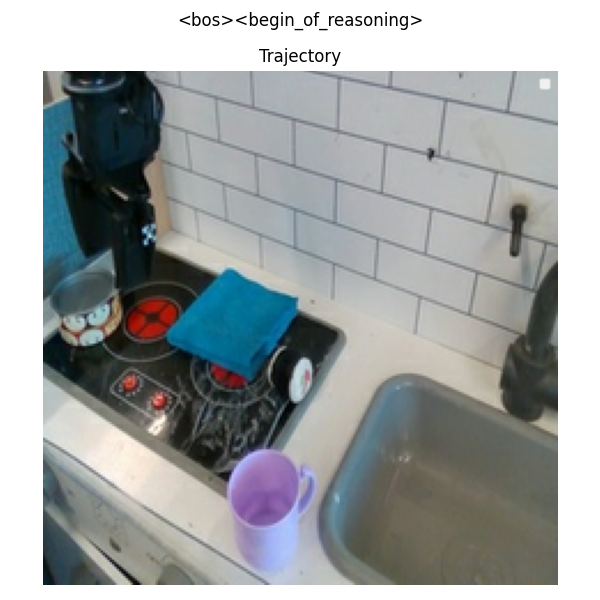

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

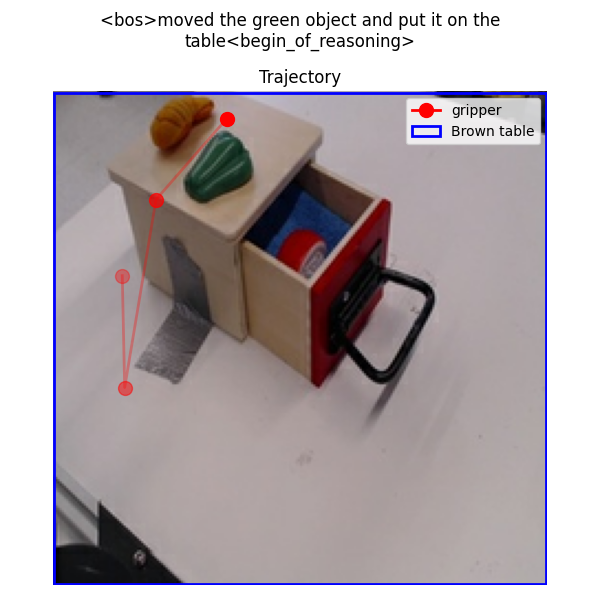

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

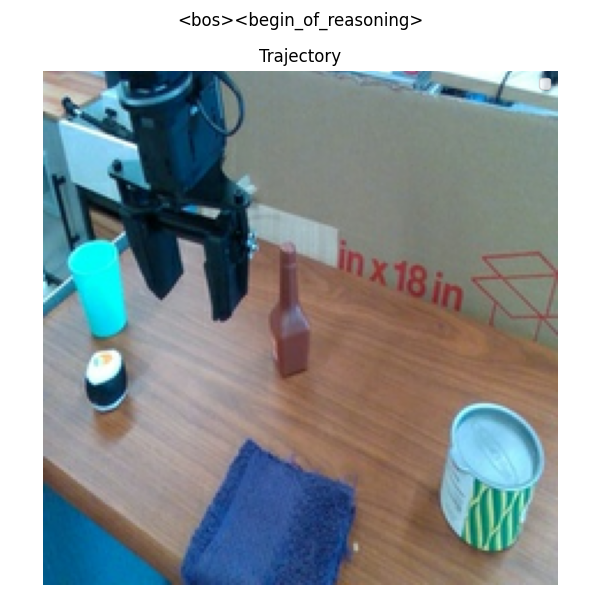

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

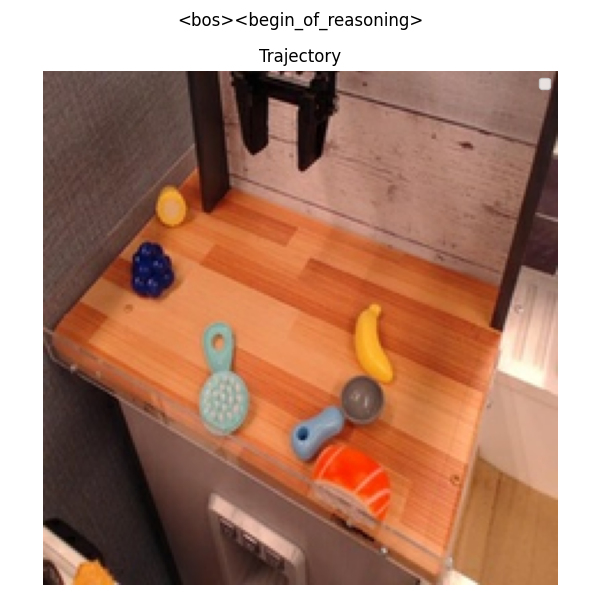

dict_keys(['image_primary', 'proprio_single_arm', 'timestep', 'pad_mask_dict', 'timestep_pad_mask', 'task_completed'])
(224, 224, 3)


""

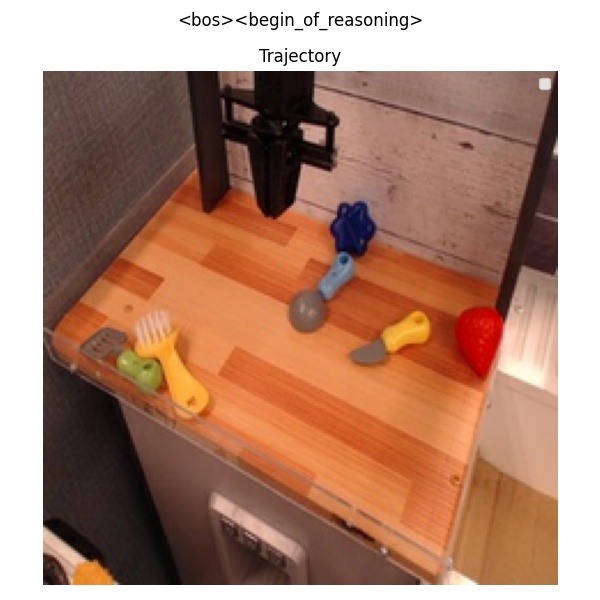

In [7]:
for i in range(0,25):
    traj = viz_trajectories[i]
    # traj['reasonings'] = np.array(["" for _ in range(len(traj['action']))])

    print(traj['observation'].keys())

    img = chain_of_thought(model, traj)
    mediapy.show_image(img)